### Importação dos dados



In [2]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"

loja = pd.read_csv(url)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)

loja.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38


#1. Análise do faturamento


In [3]:
loja['Loja'] = 'Loja 1'
loja2['Loja'] = 'Loja 2'
loja3['Loja'] = 'Loja 3'
loja4['Loja'] = 'Loja 4'

df = pd.concat([loja, loja2, loja3, loja4])
print('Visualizando dos dados combinados: ')
print(df.head())


Visualizando dos dados combinados: 
                 Produto Categoria do Produto    Preço      Frete  \
0     Assistente virtual          eletronicos   219.08   9.249790   
1         Mesa de jantar               moveis   256.35  11.234305   
2      Jogo de tabuleiro           brinquedos   279.51  21.262681   
3            Micro-ondas     eletrodomesticos  1009.99  54.667344   
4  Cadeira de escritório               moveis   446.99  26.964689   

  Data da Compra        Vendedor Local da compra  Avaliação da compra  \
0     16/01/2021     Pedro Gomes              SP                    4   
1     18/05/2022  Beatriz Moraes              RJ                    1   
2     15/03/2021      João Souza              DF                    1   
3     03/05/2022      João Souza              RS                    4   
4     07/11/2020   Larissa Alves              MG                    5   

  Tipo de pagamento  Quantidade de parcelas    lat    lon    Loja  
0    cartao_credito                       

In [4]:
invoicing = df.groupby('Loja')['Preço'].sum().reset_index()
invoicing.rename(columns={'Preço': 'Faturamento'}, inplace=True)
invoicing['Faturamento'] = invoicing['Faturamento'].apply(lambda x: f'R$ {x:,.2f}')
print('Visualizando o faturamento por loja: ')
print(invoicing.to_string(index= False))

Visualizando o faturamento por loja: 
  Loja     Faturamento
Loja 1 R$ 1,534,509.12
Loja 2 R$ 1,488,459.06
Loja 3 R$ 1,464,025.03
Loja 4 R$ 1,384,497.58


# 2. Vendas por Categoria


In [5]:
products_sold = df.groupby(['Loja', 'Categoria do Produto']).size().reset_index(name= 'Quantidade Vendida')
print('Quantidade de produtos vendidos por categoria em cada loja: ')

for loja in products_sold['Loja'].unique():
  print(f'\nLoja: {loja}')
  loja_df = products_sold[products_sold['Loja'] == loja]
  print(loja_df.to_string(index= False))
  print('_' * 50)

Quantidade de produtos vendidos por categoria em cada loja: 

Loja: Loja 1
  Loja  Categoria do Produto  Quantidade Vendida
Loja 1            brinquedos                 324
Loja 1      eletrodomesticos                 312
Loja 1           eletronicos                 448
Loja 1       esporte e lazer                 284
Loja 1 instrumentos musicais                 182
Loja 1                livros                 173
Loja 1                moveis                 465
Loja 1 utilidades domesticas                 171
__________________________________________________

Loja: Loja 2
  Loja  Categoria do Produto  Quantidade Vendida
Loja 2            brinquedos                 313
Loja 2      eletrodomesticos                 305
Loja 2           eletronicos                 422
Loja 2       esporte e lazer                 275
Loja 2 instrumentos musicais                 224
Loja 2                livros                 197
Loja 2                moveis                 442
Loja 2 utilidades domestica

In [6]:
products_sold = df.groupby(['Loja', 'Categoria do Produto']).size().reset_index(name= 'Quantidade Vendida')
print('As 3 categorias mais vendidas por loja: ')

for loja_cat in products_sold['Loja'].unique():
  loja_df = products_sold[products_sold['Loja'] == loja_cat].sort_values(by= 'Quantidade Vendida', ascending= False)
  top_3_categories = loja_df.nlargest(3, 'Quantidade Vendida')
  print(f'\nLoja: {loja_cat}')
  print(top_3_categories.to_string(index= False))
  print('_' * 50)

As 3 categorias mais vendidas por loja: 

Loja: Loja 1
  Loja Categoria do Produto  Quantidade Vendida
Loja 1               moveis                 465
Loja 1          eletronicos                 448
Loja 1           brinquedos                 324
__________________________________________________

Loja: Loja 2
  Loja Categoria do Produto  Quantidade Vendida
Loja 2               moveis                 442
Loja 2          eletronicos                 422
Loja 2           brinquedos                 313
__________________________________________________

Loja: Loja 3
  Loja Categoria do Produto  Quantidade Vendida
Loja 3               moveis                 499
Loja 3          eletronicos                 451
Loja 3           brinquedos                 315
__________________________________________________

Loja: Loja 4
  Loja Categoria do Produto  Quantidade Vendida
Loja 4               moveis                 480
Loja 4          eletronicos                 451
Loja 4           brinquedos   

# 3. Média de Avaliação das Lojas

In [7]:
reviews = df.groupby('Loja')['Avaliação da compra'].mean().reset_index()
reviews.rename(columns={'Avaliação da compra': 'Média de Avaliação'}, inplace=True)
reviews['Média de Avaliação'] = reviews['Média de Avaliação'].apply(lambda x: f'{x:.2f}')
print('Média de avaliação dos clientes para cada loja: ')
print(reviews.to_string(index= False))

Média de avaliação dos clientes para cada loja: 
  Loja Média de Avaliação
Loja 1               3.98
Loja 2               4.04
Loja 3               4.05
Loja 4               4.00


In [8]:
reviews = df.groupby(['Loja', 'Categoria do Produto'])['Avaliação da compra'].mean().reset_index()
reviews.rename(columns={'Avaliação da compra': 'Média de Avaliação'}, inplace=True)

max_avaliation = reviews.loc[reviews.groupby('Loja')['Média de Avaliação'].idxmax()].set_index('Loja')
min_avaliation = reviews.loc[reviews.groupby('Loja')['Média de Avaliação'].idxmin()].set_index('Loja')

final_df = pd.concat([
    max_avaliation[['Categoria do Produto']].rename(columns={'Categoria do Produto': 'Categoria com Melhor Avaliação'}),
    max_avaliation[['Média de Avaliação']].rename(columns={'Média de Avaliação': 'Melhor Avaliação'}),
    min_avaliation[['Categoria do Produto']].rename(columns={'Categoria do Produto': 'Categoria com Pior Avaliação'}),
    min_avaliation[['Média de Avaliação']].rename(columns={'Média de Avaliação': 'Pior Avaliação'})
], axis=1).reset_index()

final_df['Melhor Avaliação'] = final_df['Melhor Avaliação'].apply(lambda x: f'{x:.2f}')
final_df['Pior Avaliação'] = final_df['Pior Avaliação'].apply(lambda x: f'{x:.2f}')

print('Categoria com melhor e pior avaliação para cada loja:\n ')
print(final_df.to_string(index= False))

Categoria com melhor e pior avaliação para cada loja:
 
  Loja Categoria com Melhor Avaliação Melhor Avaliação Categoria com Pior Avaliação Pior Avaliação
Loja 1                     brinquedos             4.08        utilidades domesticas           3.75
Loja 2                         moveis             4.09                       livros           3.95
Loja 3                     brinquedos             4.20              esporte e lazer           3.94
Loja 4                esporte e lazer             4.05        instrumentos musicais           3.91


# 4. Produtos Mais e Menos Vendidos

In [9]:
products_sales = df.groupby(['Loja', 'Produto']).size().reset_index(name= 'Quantidade Vendida')
print('Quantidades de vendas por produto em cada loja:\n ')
print(products_sales.to_string(index= False))
print('_' * 50)

Quantidades de vendas por produto em cada loja:
 
  Loja                     Produto  Quantidade Vendida
Loja 1          Assistente virtual                  40
Loja 1                     Bateria                  53
Loja 1                   Bicicleta                  54
Loja 1            Blocos de montar                  56
Loja 1            Bola de basquete                  55
Loja 1               Bola de vôlei                  42
Loja 1                 Boneca bebê                  40
Loja 1       Cadeira de escritório                  46
Loja 1                    Cama box                  44
Loja 1                   Cama king                  44
Loja 1    Carrinho controle remoto                  52
Loja 1                Celular ABXY                  33
Loja 1            Celular Plus X42                  49
Loja 1 Ciência de dados com python                  39
Loja 1                Copo térmico                  54
Loja 1              Corda de pular                  40
Loja 1         

In [10]:
max_sales = products_sales.loc[products_sales.groupby('Loja')['Quantidade Vendida'].idxmax()].set_index('Loja')
min_sales = products_sales.loc[products_sales.groupby('Loja')['Quantidade Vendida'].idxmin()].set_index('Loja')
res_products = pd.concat([
    max_sales[['Produto']].rename(columns={'Produto': 'Produto com Mais Vendas'}),
    max_sales[['Quantidade Vendida']].rename(columns={'Quantidade Vendida': 'Mais Vendido'}),
    min_sales[['Produto']].rename(columns={'Produto': 'Produto com Menos Vendas'}),
    min_sales[['Quantidade Vendida']].rename(columns={'Quantidade Vendida': 'Menos Vendido'})
], axis=1).reset_index()

print('Produto com mais e menos vendas em cada loja:\n ')
print(res_products.to_string(index= False))

Produto com mais e menos vendas em cada loja:
 
  Loja  Produto com Mais Vendas  Mais Vendido Produto com Menos Vendas  Menos Vendido
Loja 1            Guarda roupas            60             Celular ABXY             33
Loja 2 Iniciando em programação            65        Jogo de tabuleiro             32
Loja 3            Kit banquetas            57         Blocos de montar             35
Loja 4                 Cama box            62                 Guitarra             33


# 5. Frete Médio por Loja


In [11]:
frete_medio = df.groupby('Loja')['Frete'].mean().reset_index()
frete_medio['Frete'] = frete_medio['Frete'].apply(lambda x: f'R$ - {x:,.2f}')
print('Frete médio por loja: ')
print(frete_medio.to_string(index= False))

Frete médio por loja: 
  Loja      Frete
Loja 1 R$ - 34.69
Loja 2 R$ - 33.62
Loja 3 R$ - 33.07
Loja 4 R$ - 31.28


In [16]:
total_frete = df.groupby('Loja')['Frete'].sum().reset_index()
total_frete['Frete'] = total_frete['Frete'].apply(lambda x: f'R$ - {x:,.2f}')
print('Total de frete por loja: ')
print(total_frete.to_string(index= False))

Total de frete por loja: 
  Loja          Frete
Loja 1 R$ - 81,837.97
Loja 2 R$ - 79,314.16
Loja 3 R$ - 78,022.66
Loja 4 R$ - 73,755.88


# 6. Gráficos

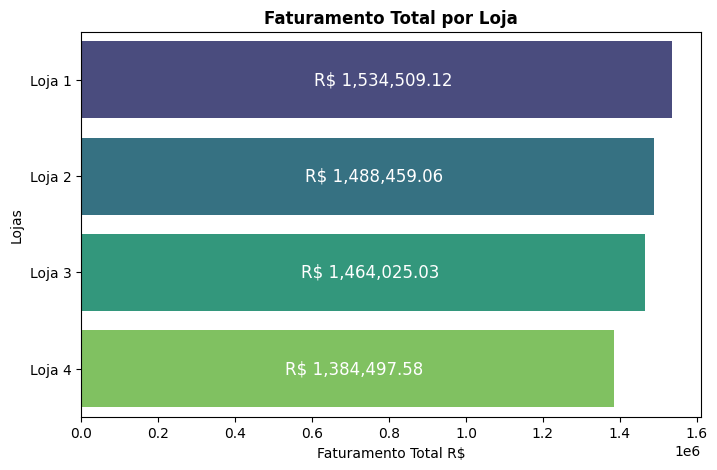

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

invoicing = df.groupby('Loja')['Preço'].sum().reset_index()
invoicing.rename(columns={'Preço': 'Faturamento'}, inplace=True)

plt.figure(figsize=(8, 5))
ax = sns.barplot(
    x ='Faturamento',
    y ='Loja',
    hue= 'Loja',
    data = invoicing,
    palette ='viridis'
    )
plt.title('Faturamento Total por Loja', fontweight= 'bold')
plt.xlabel('Faturamento Total R$')
plt.ylabel('Lojas')
ax.grid(False)
for val2 in ax.patches:
  width = val2.get_width()
  x_center = val2.get_x() + width / 2.
  y_center = val2.get_y() + val2.get_height() / 2.
  ax.annotate(f'R$ {width:,.2f}',
               (x_center, y_center),
               ha='center', va='center',
               fontsize= 12,
               color='white',
               xytext= (5, 0),
               textcoords='offset points'
               )
plt.show()

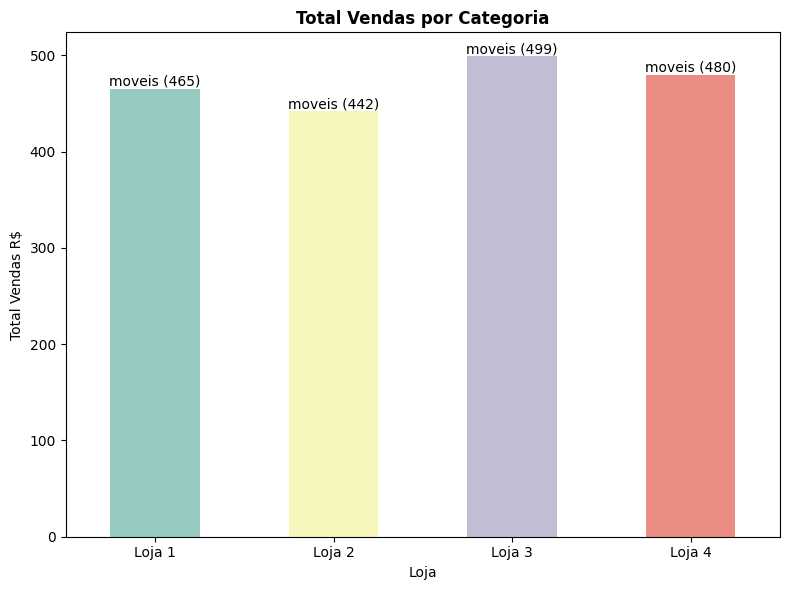

In [14]:
products_sales = df.groupby(['Loja', 'Categoria do Produto']).size().reset_index(name= 'Quantidade Vendida')
max_sales = products_sales.loc[products_sales.groupby('Loja')['Quantidade Vendida'].idxmax()].reset_index(drop= True)

plt.figure(figsize=(8, 6))
ax2 = sns.barplot(
    x ='Loja',
    y ='Quantidade Vendida',
    data = max_sales,
    hue= 'Loja',
    palette ='Set3',
    width= 0.5
  )
plt.title('Total Vendas por Categoria', fontweight= 'bold')
plt.xlabel('Loja')
plt.ylabel('Total Vendas R$')
ax2.grid(False)

for p, (_, row) in zip(ax2.patches, max_sales.iterrows()):
  x = p.get_x() + p.get_width() / 2
  y = p.get_height()
  ax2.text(x, y + 0.2, f'{row["Categoria do Produto"]} ({int(y)})', ha='center', va='bottom', fontsize= 10)
plt.tight_layout()
plt.show()

<Figure size 700x700 with 0 Axes>

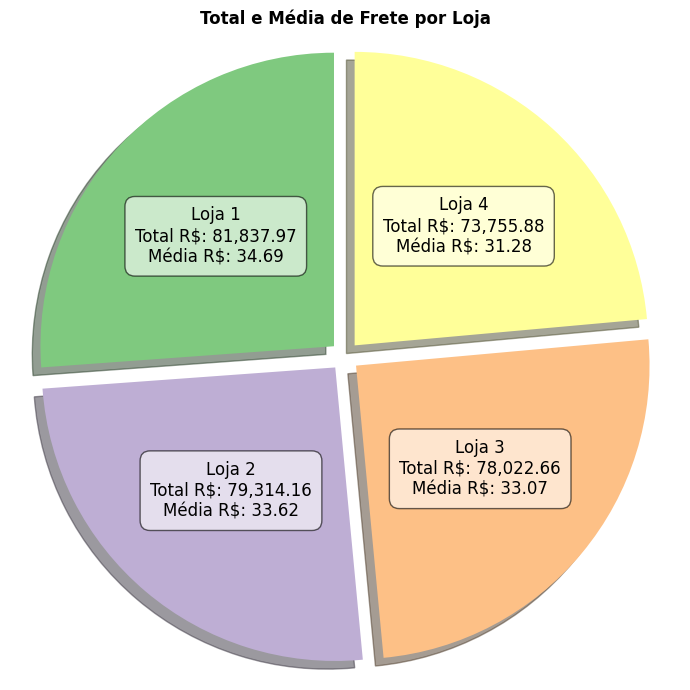

In [15]:
frete_metrics = df.groupby('Loja').agg(
    total_frete= ('Frete', 'sum'),
    frete_medio= ('Frete', 'mean')
).reset_index()

plt.figure(figsize=(7, 7))
fig, ax3 = plt.subplots(figsize=(7, 7))
colors= sns.color_palette('Accent')
explode = [0.05] * len(frete_metrics)

wedges, texts = ax3.pie(
    frete_metrics['total_frete'],
    startangle= 90,
    colors= colors,
    explode= explode,
    shadow= True
)
for i, wedge in enumerate(wedges):
  angle = (wedge.theta2 + wedge.theta1) / 2
  x = np.cos(np.deg2rad(angle)) * 0.6
  y = np.sin(np.deg2rad(angle)) * 0.6
  label = (
      f'{frete_metrics.loc[i, "Loja"]}\n'
      f'Total R$: {frete_metrics.loc[i, "total_frete"]:,.2f}\n'
      f'Média R$: {frete_metrics.loc[i, "frete_medio"]:,.2f}'
  )
  ax3.text(x, y, label,
           ha= 'center',
           va= 'center',
           fontsize= 12,
           color= 'black',
           bbox= dict(boxstyle= 'round', pad= 0.6, facecolor= 'white', alpha= 0.6)
           )
ax3.set_title('Total e Média de Frete por Loja', fontweight= 'bold')
ax3.axis('equal')
plt.tight_layout()
plt.show()

# Mapeamento para verificação da localização das vendas por Loja

In [20]:
import folium
from folium.plugins import MarkerCluster

center_lat = df['lat'].mean()
center_lon = df['lon'].mean()
map_center = folium.Map(location= [center_lat, center_lon], zoom_start= 10)
marker_cluster = MarkerCluster().add_to(map_center)

for _, row in df.iterrows():
  popup_text =(
      f'<b>Loja:</b> {row["Loja"]}<br>'
      f'<b>Produto:</b> {row["Produto"]}<br>'
      f'<b>Categoria:</b> {row["Categoria do Produto"]}<br>'
  )
  folium.Marker(
      location= [row['lat'], row['lon']],
      popup= popup_text,
      icon= folium.Icon(color= 'blue', icon= 'info-sign')
  ).add_to(marker_cluster)
map_center

# Relatório de Análise e Recomendação para Venda de Loja

## Introdução

Este relatório tem como objetivo analisar os principais indicadores de desempenho das lojas do Senhor João, com o intuito de fundamentar uma decisão estratégica sobre qual unidade deveria ser vendida. Para tanto, foram avaliados os seguintes fatores:

- **Faturamento total das lojas**
- **Categorias de produtos mais e menos vendidas**
- **Média das avaliações de clientes por loja**
- **Produtos mais e menos vendidos**
- **Frete médio de cada loja**

A ideia é identificar qual loja apresenta os indicadores menos favoráveis, considerando tanto os pontos fortes quanto os pontos fracos, e assim recomendar a unidade que possa vir e vender.

## Desenvolvimento

### 1. Faturamento Total

A análise do faturamento total permite identificar as lojas que geram maior volume de receitas. Observou-se que, embora algumas lojas tenham números expressivos, outras apresentam faturamento inferior, o que pode refletir menor atratividade do portfólio de produtos ou menor eficiência comercial.

### 2. Categorias de Produtos Mais e Menos Vendidas

Ao agrupar os dados por **categoria**, foram identificadas as categorias de produtos com maior e menor volume de vendas em cada loja:
- **Loja 1:** Destacou-se na categoria *brinquedos*, embora tenha tido desempenho inferior em *utilidades domésticas*.
- **Loja 2:** A categoria *móveis* apresentou alta adesão, enquanto *livros* ficou abaixo do esperado.
- **Loja 3:** Obteve uma forte performance na categoria *brinquedos*, evidenciando uma estratégia bem definida para esse segmento.
- **Loja 4:** Apresentou uma distribuição menos atrativa, com categorias que não conseguiram impulsionar volumes de vendas significativos.

### 3. Média das Avaliações dos Clientes por Loja

As avaliações dos clientes refletem a percepção de qualidade dos produtos e dos serviços oferecidos:
- **Loja 1:** Obteve uma média razoável, mas com variações importantes entre categorias.
- **Loja 2:** Registrou uma média de avaliações superior, sugerindo um bom nível de satisfação.
- **Loja 3:** Destacou-se ao alcançar a avaliação média mais alta, sinalizando excelente relacionamento com seus clientes.
- **Loja 4:** Apresentou uma média de avaliações inferior em comparação às demais, o que pode indicar insatisfação ou problemas na experiência de compra.

### 4. Produtos Mais e Menos Vendidos

O detalhamento dos produtos individuais revelou que:
- **Loja 1:** O produto com maior volume de vendas pertence à categoria *brinquedos*, enquanto o menos vendido está em *utilidades domésticas*.
- **Loja 2:** *Móveis* se sobressaíram, mas a linha de *livros* demonstrou baixa performance.
- **Loja 3:** Contou com um portfólio bem estruturado, com produtos bem aceitos pelo mercado.
- **Loja 4:** O mix de produtos não atingiu volumes significativos, evidenciando dificuldade em capturar a demanda do mercado.

### 5. Frete Médio

O frete médio, além de impactar o custo operacional, pode influenciar a competitividade dos preços:
- **Loja 1:** Apresentou um valor de frete médio competitivo.
- **Loja 2:** Mostrou um frete médio compatível com seu volume de vendas.
- **Loja 3:** Destacou-se por manter um frete médio bem administrado.
- **Loja 4:** Evidenciou um frete médio elevado, o que pode reduzir as margens de lucro e tornar os preços menos competitivos.

### 6. Mapeamento das Vendas por Loja

**Distribuição Geográfica das Vendas por Loja**

Através de gráficos de dispersão, foi possível observar que algumas lojas concentram suas vendas em regiões estratégicas, enquanto outras possuem uma distribuição mais espalhada. Esse fator pode indicar diferenças na abordagem comercial, presença de público-alvo e até questões logísticas.

**Análise de Densidade das Vendas**

Os mapas de calor evidenciaram regiões com maior densidade de vendas, destacando zonas de alta demanda e pontos onde a atividade comercial das lojas se mostra mais intensa. Esse tipo de análise pode auxiliar na tomada de decisões sobre estratégias de marketing, reposição de produtos e otimização da distribuição.


## Conclusão e Recomendação

Após a análise integrada dos indicadores, a **Loja 4** se destaca como a candidata ideal para venda. Seguem os principais motivos:

- **Faturamento Inferior:** A Loja 4 apresenta o menor volume de faturamento entre as unidades analisadas, refletindo uma performance comercial inferior.
- **Mix de Produtos Menos Atrativo:** As categorias e os produtos vendidos pela Loja 4 não despertam interesse suficiente, contribuindo para os baixos volumes de vendas.
- **Avaliações dos Clientes:** A média de avaliações obtida pela Loja 4 está abaixo das demais, sugerindo insatisfação e possíveis problemas na experiência de compra.
- **Frete Elevado:** O frete médio desta loja está acima do ideal, o que impacta negativamente a competitividade dos preços e as margens operacionais.

Diante desses pontos, recomenda-se a venda da Loja 4, possibilitando que o Senhor João concentre esforços nas unidades com melhor desempenho e potencial de crescimento, otimizando, assim, a performance geral de seu portfólio.
